# Pre-Trained Autoencoder

In our previous notebook, `03_autoencoder_4block.ipynb`, we tried 4, 5 and 6-block convolutional autoencoders, comparing the tradeoffs of differing bottleneck sizes.

This notebook takes a different approach: **Transfer Learning**. In this notebook, instead of training an encoder from scratch and relying purely on spatial bottlenecks, we will swap our encoder for a pre-trained one (ResNet18). Pre-trained models, having been trained on millions of images, should be able to extract stronger visual features compared to our simple encoder, and this may help our autoencoder better reconstruct normal cable structure. We will try this and evaluate whether it helps with anomaly detection.

## 1. Overview

### 1.1 Objectives

1. **Architecture**: Define the `AutoencoderPretrained` model in `src/models.py` using a pre-trained ResNet18 backbone
2. **Model Training**: Train the decoder network on unaugmented normal samples using a combined L1 + SSIM loss function and visualize loss curves, using `src/train.py`
3. **Evaluation**: Generate anomaly maps to see if pre-trained features successfully fail to reconstruct anomalies while preserving normal cable structure, and measure anomaly detection performance on the test set using AUROC and AUPRO, with `src/evaluate.py` and `src/metrics.py`

### 1.2 Imports and Setup

In [1]:
# Some magic so that the notebook will reload external python modules
# see [http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython](http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython)
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch

PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))
    
from src.utils import (
    set_seed, get_device, tensor_to_img,
    CHECKPOINTS_DIR, OUT_DIR, FIGURES_DIR
)
from src.dataset import get_transforms, get_train_val_dataloaders, get_test_dataloader
from src.models import AutoencoderResNet18
from src.train import train_autoencoder, plot_loss_curves
from src.evaluate import (
    plot_normal_reconstructions, plot_anomalous_reconstructions,
    generate_anomaly_maps, plot_anomaly_maps
)
from src.metrics import calculate_image_auroc, calculate_pixel_auroc, calculate_aupro, plot_roc_curves

In [3]:
set_seed()
device = get_device()
print(f"Using device: {device}")

Using device: mps


### 1.3 Data Loading

We will follow the same data pipeline as in the previous notebooks, loading our train, val, and test dataloaders directly using `src/dataset.py` with the same random seed and 85/15 split.

In [4]:
BATCH_SIZE = 16
IMAGE_SIZE = (256, 256)

#                                   Unaugmented, resized to 256x256
train_transform = get_transforms(augment_mode=0, image_size=IMAGE_SIZE)
train_loader, val_loader = get_train_val_dataloaders(
    batch_size=BATCH_SIZE,
    val_split=0.15,
    train_transform=train_transform,
    image_size=IMAGE_SIZE,
    seed=42
)

test_loader = get_test_dataloader(
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE
)

n_train = len(train_loader.dataset)
n_val   = len(val_loader.dataset)
n_test  = len(test_loader.dataset)

print('              Train / Val / Test')
print(f'Dataset Split: {n_train} / {n_val} / {n_test}')
print(f'Batches      : {len(train_loader)} / {len(val_loader)} / {len(test_loader)}')

              Train / Val / Test
Dataset Split: 191 / 33 / 150
Batches      : 12 / 3 / 10


## 2. Model Architecture

For this prototype, we use a ResNet18 backbone as our encoder. 

* **Encoder:** Pre-trained ResNet18 with the global average pooling and fully-connected layers removed. It consists of 5 stages, after which our 256x256x3 input image will become an 8x8x512 feature map.
* **Decoder:** A 5-block transposed convolutional network that takes in the 8x8x512 feature map and outputs a 256x256x3 reconstructed image (slightly different from our previous 5-block decoder which took in 8x8x256).

Since pre-trained ImageNet backbones require specific normalization (mean `[0.485, 0.456, 0.406]` and std `[0.229, 0.224, 0.225]`), we have included normalization in the forward pass of our `AutoencoderResNet18` model. This allows our dataloaders to continue outputting standard `[0, 1]` image tensors, and ensures our previously used loss functions and visualization functions work for this model.

### 2.1 Model Setup

In [5]:
# Instantiate the pre-trained autoencoder
model = AutoencoderResNet18().to(device)
print(model)

total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print('\n=== Model Summary ===')
print(f'Total parameters    : {total_params:,}')
print(f'Trainable parameters: {trainable_params:,}')

AutoencoderResNet18(
  (normalize): Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  

### 2.2 Forward Pass Verification

We pass a single batch of images through the model to verify that our tensor dimensions are being handled properly by the model. It should output `[B, 3, 256, 256]`.

In [6]:
train_batch = next(iter(train_loader))

model.eval()
with torch.no_grad():
    sample_input = train_batch.to(device)
    sample_output = model(sample_input)

assert sample_output.shape == sample_input.shape, f"Shape mismatch: {sample_output.shape} != {sample_input.shape}"
print(f"Input  shape : {sample_input.shape}")
print(f"Output shape : {sample_output.shape}")
print("Sanity check passed.")

Input  shape : torch.Size([16, 3, 256, 256])
Output shape : torch.Size([16, 3, 256, 256])
Sanity check passed.


## 3. Model Training

We will now train our pre-trained-encoder model on normal images only.

### 3.1 Hyperparameter Setup

We use the same setup as the one previously used for the 3-block baseline (same hyperparameters), so we can compare to it later.

In [7]:
L1_WEIGHT = 0.5
EPOCHS = 150
LEARNING_RATE = 1e-3
SAVE_PATH = CHECKPOINTS_DIR / "autoencoder_pretrained_frozen.pth"

### 3.2 Training Loop

Let's call the training function from `src/train.py` and execute the training loop.

In [8]:
print(f"Starting training run. Weights will be saved to {SAVE_PATH}\n")

history = train_autoencoder(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=EPOCHS,
    lr=LEARNING_RATE,
    l1_weight=L1_WEIGHT,
    save_path=SAVE_PATH,
    patience=20
)

Starting training run. Weights will be saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth

Starting training on mps for 150 epochs...


Epoch 1/150 - Train Loss: 0.4787 - Val Loss: 0.5187
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 2/150 - Train Loss: 0.4337 - Val Loss: 0.4432
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 3/150 - Train Loss: 0.4196 - Val Loss: 0.4217
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 4/150 - Train Loss: 0.4106 - Val Loss: 0.4111
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 5/150 - Train Loss: 0.4036 - Val Loss: 0.4047
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 6/150 - Train Loss: 0.3987 - Val Loss: 0.3999
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 7/150 - Train Loss: 0.3943 - Val Loss: 0.3955
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 8/150 - Train Loss: 0.3901 - Val Loss: 0.3917
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 9/150 - Train Loss: 0.3865 - Val Loss: 0.3882
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 10/150 - Train Loss: 0.3835 - Val Loss: 0.3854
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 11/150 - Train Loss: 0.3807 - Val Loss: 0.3834
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 12/150 - Train Loss: 0.3778 - Val Loss: 0.3823
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 13/150 - Train Loss: 0.3737 - Val Loss: 0.3792
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 14/150 - Train Loss: 0.3648 - Val Loss: 0.3680
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 15/150 - Train Loss: 0.3513 - Val Loss: 0.3556
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 16/150 - Train Loss: 0.3390 - Val Loss: 0.3467
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 17/150 - Train Loss: 0.3304 - Val Loss: 0.3393
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 18/150 - Train Loss: 0.3226 - Val Loss: 0.3358
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 19/150 - Train Loss: 0.3156 - Val Loss: 0.3315
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 20/150 - Train Loss: 0.3072 - Val Loss: 0.3258
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 21/150 - Train Loss: 0.2979 - Val Loss: 0.3207
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 22/150 - Train Loss: 0.2882 - Val Loss: 0.3133
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 23/150 - Train Loss: 0.2803 - Val Loss: 0.3087
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 24/150 - Train Loss: 0.2743 - Val Loss: 0.3032
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 25/150 - Train Loss: 0.2685 - Val Loss: 0.3017
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 26/150 - Train Loss: 0.2637 - Val Loss: 0.2977
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 27/150 - Train Loss: 0.2573 - Val Loss: 0.2943
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 28/150 - Train Loss: 0.2537 - Val Loss: 0.2940
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 29/150 - Train Loss: 0.2498 - Val Loss: 0.2943
 -> No improvement for 1/20 epoch(s).


Epoch 30/150 - Train Loss: 0.2462 - Val Loss: 0.2918
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 31/150 - Train Loss: 0.2427 - Val Loss: 0.2928
 -> No improvement for 1/20 epoch(s).


Epoch 32/150 - Train Loss: 0.2400 - Val Loss: 0.2918
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 33/150 - Train Loss: 0.2355 - Val Loss: 0.2904
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_frozen.pth


Epoch 34/150 - Train Loss: 0.2331 - Val Loss: 0.2913
 -> No improvement for 1/20 epoch(s).


Epoch 35/150 - Train Loss: 0.2312 - Val Loss: 0.2915
 -> No improvement for 2/20 epoch(s).


Epoch 36/150 - Train Loss: 0.2288 - Val Loss: 0.2919
 -> No improvement for 3/20 epoch(s).


Epoch 37/150 - Train Loss: 0.2259 - Val Loss: 0.2920
 -> No improvement for 4/20 epoch(s).


Epoch 38/150 - Train Loss: 0.2227 - Val Loss: 0.2914
 -> No improvement for 5/20 epoch(s).


Epoch 39/150 - Train Loss: 0.2199 - Val Loss: 0.2909
 -> No improvement for 6/20 epoch(s).


Epoch 40/150 - Train Loss: 0.2177 - Val Loss: 0.2938
 -> No improvement for 7/20 epoch(s).


Epoch 41/150 - Train Loss: 0.2162 - Val Loss: 0.2937
 -> No improvement for 8/20 epoch(s).


Epoch 42/150 - Train Loss: 0.2153 - Val Loss: 0.2925
 -> No improvement for 9/20 epoch(s).


Epoch 43/150 - Train Loss: 0.2131 - Val Loss: 0.2946
 -> No improvement for 10/20 epoch(s).


Epoch 44/150 - Train Loss: 0.2098 - Val Loss: 0.2925
 -> No improvement for 11/20 epoch(s).


Epoch 45/150 - Train Loss: 0.2093 - Val Loss: 0.2925
 -> No improvement for 12/20 epoch(s).


Epoch 46/150 - Train Loss: 0.2073 - Val Loss: 0.2940
 -> No improvement for 13/20 epoch(s).


Epoch 47/150 - Train Loss: 0.2070 - Val Loss: 0.2949
 -> No improvement for 14/20 epoch(s).


Epoch 48/150 - Train Loss: 0.2043 - Val Loss: 0.2937
 -> No improvement for 15/20 epoch(s).


Epoch 49/150 - Train Loss: 0.2024 - Val Loss: 0.2936
 -> No improvement for 16/20 epoch(s).


Epoch 50/150 - Train Loss: 0.2000 - Val Loss: 0.2950
 -> No improvement for 17/20 epoch(s).


Epoch 51/150 - Train Loss: 0.1983 - Val Loss: 0.2943
 -> No improvement for 18/20 epoch(s).


Epoch 52/150 - Train Loss: 0.1986 - Val Loss: 0.2948
 -> No improvement for 19/20 epoch(s).


Epoch 53/150 - Train Loss: 0.1971 - Val Loss: 0.2951
 -> No improvement for 20/20 epoch(s).

Early stopping triggered! Training halted at epoch 53.
Training complete.


### 3.3 Loss Curve Visualization

We have completed training the model! Now, let's plot the training and validation loss side-by-side (standard and log-scaled) to verify the model converged and check for signs of overfitting.

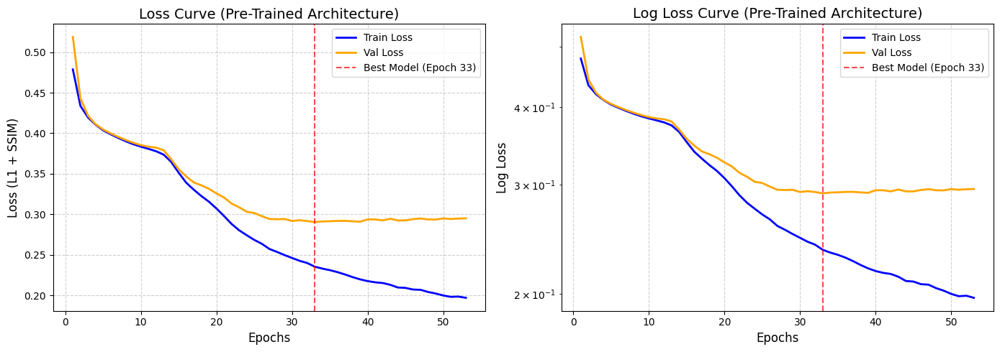

In [10]:
plot_loss_curves(
    history, 
    title_suffix="(Pre-Trained Architecture)", 
    # save=True, 
    # save_path=FIGURES_DIR / "Fig21_Pretrained_Loss.png"
)

## 4. Evaluation

### 4.1 Validating Reconstruction Quality

Let's first verify visually that the training worked and the model can successfully reconstruct normal cables. We will pass a batch from the validation set (which only contains normal images) through the fully trained model and look at its outputs.

In [11]:
# Load the model
model.load_state_dict(torch.load(SAVE_PATH))
model.eval()

# Get validation batch
val_batch = next(iter(val_loader))
val_images = val_batch.to(device)

# Run them through the model
with torch.no_grad():
    val_reconstructed = model(val_images)

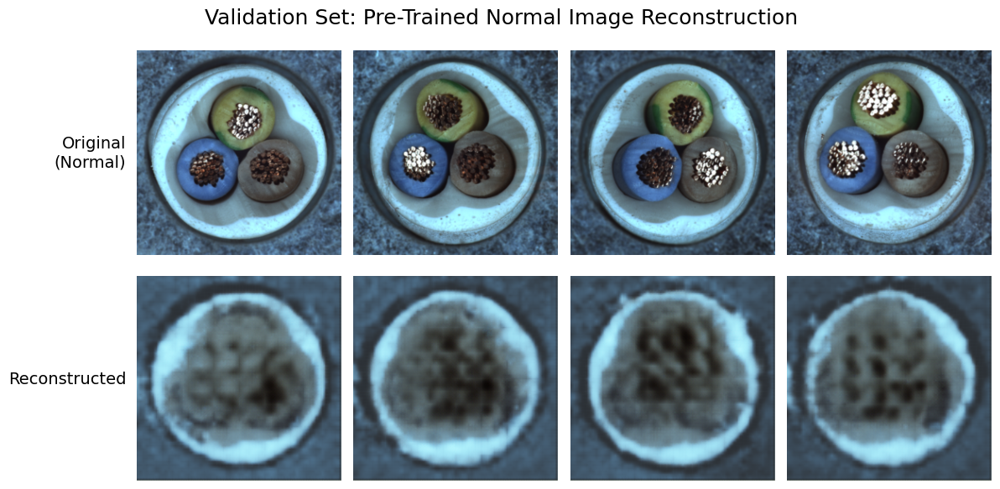

In [17]:
# Plot and visualize
plot_normal_reconstructions(
    original_tensors=val_images, 
    recon_tensors=val_reconstructed, 
    title='Validation Set: Pre-Trained Normal Image Reconstruction',
    num_samples=4,
    # save=True,
    # save_path=FIGURES_DIR / "Fig22_Pretrained_Normal_Reconstruction.png"
)


It seems like the model is able to reconstruct the background and outer part of the cable when normal samples are passed to it, but it is not able to reconstruct any of the internal wires.

### 4.2 Anomaly Reconstruction

Now, let's test what the model does when reconstructing defects.

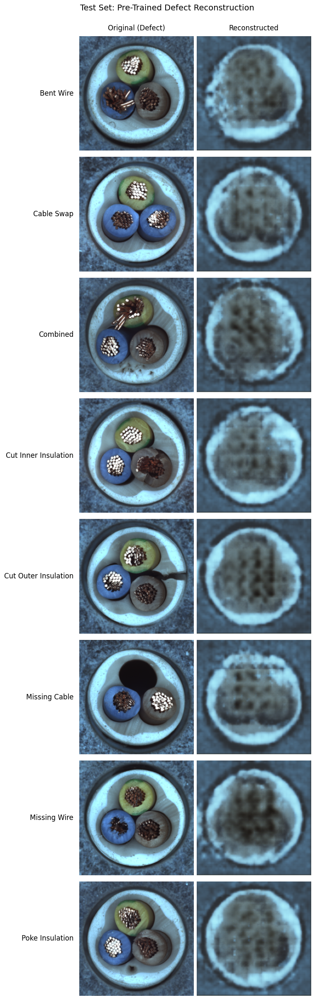

In [19]:
# Extract the dataset from the test loader
test_dataset = test_loader.dataset

# Plot the anomalous reconstructions
plot_anomalous_reconstructions(
    model=model, 
    dataset=test_dataset, 
    device=device,
    title='Test Set: Pre-Trained Defect Reconstruction',
    # save=True,
    # save_path=FIGURES_DIR / "Fig23_Pretrained_Defect_Reconstruction.png"
)


Same issues encountered here: the general structure of the background and outer cable is present, but none of the internal cables are being reconstructed at all.

### 4.3 Evaluation Metrics

Let's get some numbers going and see if this poor reconstruction result from our pre-trained-encoder model also leads to weak anomaly detection performance.

Same as before, we will be using these three metrics:

1. **Image-level AUROC (Area Under the Receiver Operating Characteristic curve):** Evaluates the model's overall ability to classify an entire image as normal or anomalous.
2. **Pixel-level AUROC:** Evaluates the model's ability to classify individual pixels as normal or anomalous.
3. **AUPRO (Area Under Per-Region Overlap curve):** Groups ground-truth anomaly pixels into distinct components and weighs each region equally, so the model is penalized just as much for missing small, subtle defects vs large, obvious ones.

### 4.3.1 Metrics Calculation

In [20]:
print("Running model on test set to generate anomaly maps...")

# Generate pixel-wise error maps (L1 difference between input and reconstruction)
anomaly_maps, masks, labels = generate_anomaly_maps(model, test_loader, device)

print(f"Generated {len(anomaly_maps)} anomaly maps.")

Running model on test set to generate anomaly maps...


Generated 150 anomaly maps.


In [21]:
print("Calculating metrics...\n")

img_auroc = calculate_image_auroc(anomaly_maps, labels)
pix_auroc = calculate_pixel_auroc(anomaly_maps, masks)
aupro = calculate_aupro(anomaly_maps, masks)

print("========================================")
print("  Pre-Trained Architecture Results")
print("========================================")
print(f"Image AUROC : {img_auroc:.4f}")
print(f"Pixel AUROC : {pix_auroc:.4f}")
print(f"AUPRO       : {aupro:.4f}")
print("========================================")

Calculating metrics...

  Pre-Trained Architecture Results
Image AUROC : 0.4670
Pixel AUROC : 0.8114
AUPRO       : 0.4313


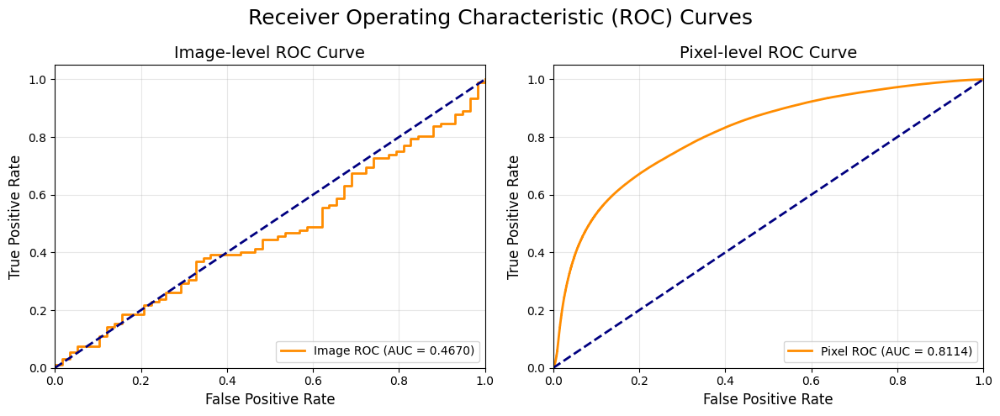

In [23]:
plot_roc_curves(
    anomaly_maps, 
    masks, 
    labels,
    # save=True,
    # save_path=FIGURES_DIR / "Fig24_Pretrained_ROC_Curves.png"
)

### 4.3.2 Visualizing Anomaly Maps

Let's check and visualize the anomaly maps for each class in the test dataset. The pre-trained encoder achieves relatively high pixel-level metrics (0.8114), but based on the previous initial visualizations, the reconstructions are poor. We inspect the anomaly maps directly to better understand which regions are contributing to the scores: is the model highlighting true defects, or is the score being inflated because easier regions like the background are being reconstructed correctly?

As before, the anomaly maps show the pixel-wise L1 reconstruction errors as a heatmap, where higher errors (closer to red) indicate regions where the model struggles to reconstruct. **A good anomaly detection model should produce high errors in ground truth defective areas**.

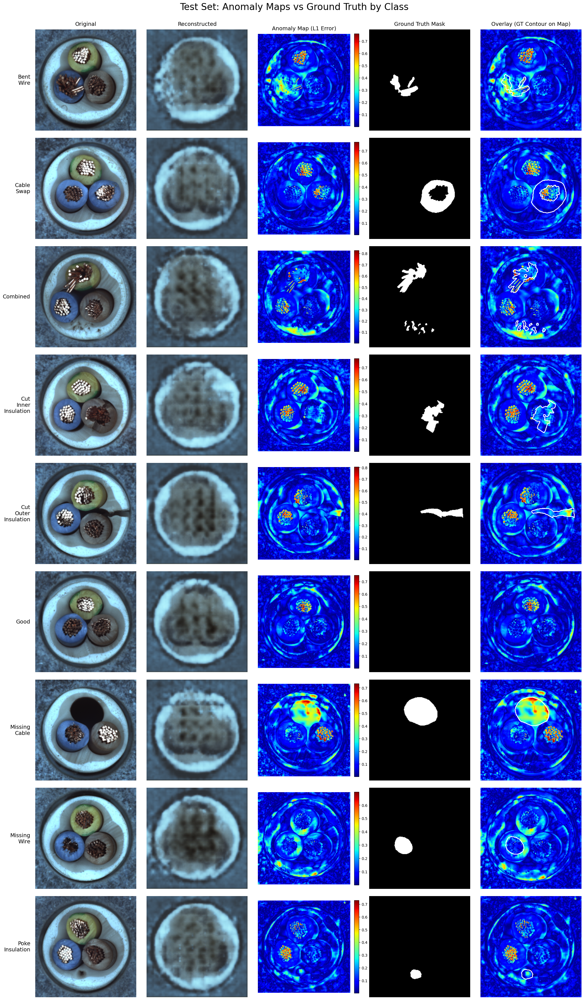

In [25]:
plot_anomaly_maps(
    model=model,
    dataset=test_dataset,
    anomaly_maps=anomaly_maps,
    device=device,
    # save=True,
    # save_path=FIGURES_DIR / "Fig25_Pretrained_Anomaly_Maps.png"
)


For some defect categories like `missing_cable`, the model produces high reconstruction error in the correct defect regions. However, the anomaly maps also confirm that the internal cable structure is not being reconstructed well overall, even in non-defective regions. We can observe this in `missing_wire` and `good`, where there are high reconstruction errors outside of the ground truth areas. This suggests that the frozen pre-trained encoder likely needs fine-tuning to adapt to this dataset.

## 5. Fine-Tuning the Encoder

The frozen pre-trained ResNet18 encoder does not reconstruct the internal parts of the cable well, as it has been trained on ImageNet images only. Let's try unfreezing the top encoder layers and fine-tune the encoder to adapt the pre-trained features to this dataset.

### 5.1 Hyperparameter Setup

Since we are now fine-tuning a pre-trained encoder, we use a much smaller learning rate (1e-5 instead of 1e-3) so that the pre-trained weights are adjusted gradually. This should hopefully allow the encoder to adapt to the cable dataset while preserving the useful visual features learned from ImageNet.

In [36]:
# Load the frozen pre-trained model weights
LOAD_PATH_FROZEN = CHECKPOINTS_DIR / "autoencoder_pretrained_frozen.pth"
model.load_state_dict(torch.load(LOAD_PATH_FROZEN))

# Unfreeze top layers of ResNet18 encoder (layer4)
model.unfreeze_top_encoder_layers()

# Hyperparameters
FINETUNE_LR = 1e-5  # Much lower than 1e-3
FINETUNE_EPOCHS = 100
L1_WEIGHT = 0.5
SAVE_PATH_FINETUNED = CHECKPOINTS_DIR / "autoencoder_pretrained_finetuned.pth"

ResNet18 'layer4' has been unfrozen for fine-tuning.


### 5.2 Fine-Tuning Training Loop

Now we run the training loop again with the top encoder layers unfrozen.

In [28]:
print(f"Starting Fine-Tuning. Weights will be saved to {SAVE_PATH_FINETUNED}\n")

history_finetuned = train_autoencoder(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=FINETUNE_EPOCHS,
    lr=FINETUNE_LR,
    l1_weight=L1_WEIGHT,
    save_path=SAVE_PATH_FINETUNED,
    patience=10
)

Starting Fine-Tuning. Weights will be saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth

Starting training on mps for 100 epochs...


Epoch 1/100 - Train Loss: 0.2294 - Val Loss: 0.2866
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 2/100 - Train Loss: 0.2257 - Val Loss: 0.2861
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 3/100 - Train Loss: 0.2235 - Val Loss: 0.2856
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 4/100 - Train Loss: 0.2223 - Val Loss: 0.2849
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 5/100 - Train Loss: 0.2210 - Val Loss: 0.2851
 -> No improvement for 1/10 epoch(s).


Epoch 6/100 - Train Loss: 0.2202 - Val Loss: 0.2847
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 7/100 - Train Loss: 0.2189 - Val Loss: 0.2844
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 8/100 - Train Loss: 0.2182 - Val Loss: 0.2843
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 9/100 - Train Loss: 0.2175 - Val Loss: 0.2841
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 10/100 - Train Loss: 0.2170 - Val Loss: 0.2840
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 11/100 - Train Loss: 0.2157 - Val Loss: 0.2840
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 12/100 - Train Loss: 0.2152 - Val Loss: 0.2837
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 13/100 - Train Loss: 0.2141 - Val Loss: 0.2838
 -> No improvement for 1/10 epoch(s).


Epoch 14/100 - Train Loss: 0.2139 - Val Loss: 0.2835
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 15/100 - Train Loss: 0.2134 - Val Loss: 0.2835
 -> No improvement for 1/10 epoch(s).


Epoch 16/100 - Train Loss: 0.2123 - Val Loss: 0.2836
 -> No improvement for 2/10 epoch(s).


Epoch 17/100 - Train Loss: 0.2117 - Val Loss: 0.2836
 -> No improvement for 3/10 epoch(s).


Epoch 18/100 - Train Loss: 0.2118 - Val Loss: 0.2837
 -> No improvement for 4/10 epoch(s).


Epoch 19/100 - Train Loss: 0.2103 - Val Loss: 0.2835
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 20/100 - Train Loss: 0.2103 - Val Loss: 0.2836
 -> No improvement for 1/10 epoch(s).


Epoch 21/100 - Train Loss: 0.2094 - Val Loss: 0.2836
 -> No improvement for 2/10 epoch(s).


Epoch 22/100 - Train Loss: 0.2092 - Val Loss: 0.2836
 -> No improvement for 3/10 epoch(s).


Epoch 23/100 - Train Loss: 0.2088 - Val Loss: 0.2833
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 24/100 - Train Loss: 0.2081 - Val Loss: 0.2832
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 25/100 - Train Loss: 0.2078 - Val Loss: 0.2835
 -> No improvement for 1/10 epoch(s).


Epoch 26/100 - Train Loss: 0.2072 - Val Loss: 0.2833
 -> No improvement for 2/10 epoch(s).


Epoch 27/100 - Train Loss: 0.2069 - Val Loss: 0.2834
 -> No improvement for 3/10 epoch(s).


Epoch 28/100 - Train Loss: 0.2064 - Val Loss: 0.2833
 -> No improvement for 4/10 epoch(s).


Epoch 29/100 - Train Loss: 0.2059 - Val Loss: 0.2831
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned.pth


Epoch 30/100 - Train Loss: 0.2054 - Val Loss: 0.2835
 -> No improvement for 1/10 epoch(s).


Epoch 31/100 - Train Loss: 0.2050 - Val Loss: 0.2835
 -> No improvement for 2/10 epoch(s).


Epoch 32/100 - Train Loss: 0.2047 - Val Loss: 0.2832
 -> No improvement for 3/10 epoch(s).


Epoch 33/100 - Train Loss: 0.2043 - Val Loss: 0.2831
 -> No improvement for 4/10 epoch(s).


Epoch 34/100 - Train Loss: 0.2037 - Val Loss: 0.2836
 -> No improvement for 5/10 epoch(s).


Epoch 35/100 - Train Loss: 0.2029 - Val Loss: 0.2832
 -> No improvement for 6/10 epoch(s).


Epoch 36/100 - Train Loss: 0.2030 - Val Loss: 0.2832
 -> No improvement for 7/10 epoch(s).


Epoch 37/100 - Train Loss: 0.2023 - Val Loss: 0.2834
 -> No improvement for 8/10 epoch(s).


Epoch 38/100 - Train Loss: 0.2020 - Val Loss: 0.2836
 -> No improvement for 9/10 epoch(s).


Epoch 39/100 - Train Loss: 0.2017 - Val Loss: 0.2834
 -> No improvement for 10/10 epoch(s).

Early stopping triggered! Training halted at epoch 39.
Training complete.


### 5.3 Fine-Tuning Loss Curve Visualization

Let's plot the training and validation loss side-by-side (standard and log-scaled) to verify the model converged and check for signs of overfitting.

Loss curve plot saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/figures/Fig26_Pretrained_Finetuned_Loss.png


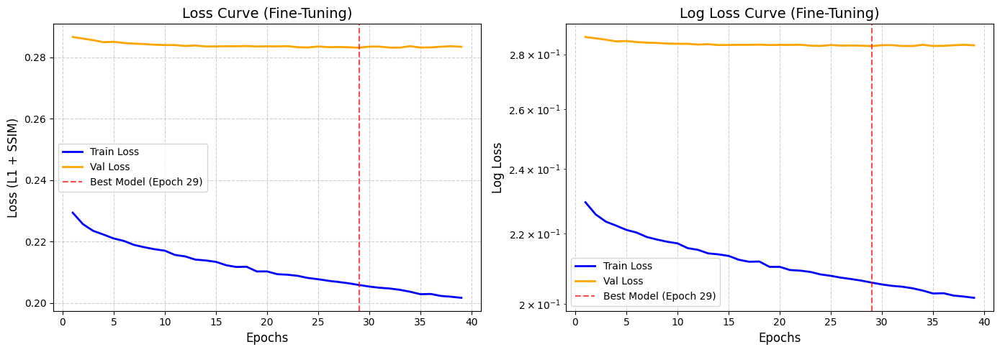

In [29]:
plot_loss_curves(
    history_finetuned, 
    title_suffix="(Fine-Tuning)", 
    save=True, 
    save_path=FIGURES_DIR / "Fig26_Pretrained_Finetuned_Loss.png"
)

## 6. Fine-Tuning Evaluation

Now that we have allowed the ResNet to learn the specific "vocabulary" of industrial cables, let's see if the internal wires can be reconstructed and if our anomaly metrics improve.

### 6.1 Reconstruction Quality

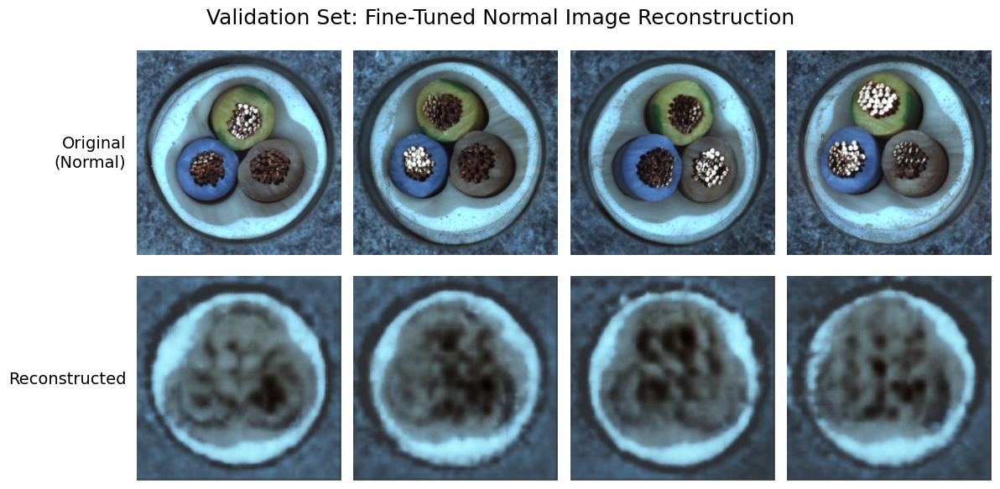

In [32]:
# Load the fine-tuned weights
model.load_state_dict(torch.load(SAVE_PATH_FINETUNED))
model.eval()

# Run the validation batch through the fine-tuned model
with torch.no_grad():
    val_reconstructed_ft = model(val_images)

# Plot and visualize
plot_normal_reconstructions(
    original_tensors=val_images, 
    recon_tensors=val_reconstructed_ft, 
    title='Validation Set: Fine-Tuned Normal Image Reconstruction',
    num_samples=4,
    # save=True,
    # save_path=FIGURES_DIR / "Fig27_Finetuned_Normal_Reconstruction.png"
)

The fine-tuned reconstructions show very little visible improvement over the initial frozen pre-trained encoder. The internal cable structure is still not being reconstructed clearly, and this is consistent with the training behavior, where the validation loss decreased only marginally during fine-tuning (0.2866 to 0.2832). We therefore move on to verify quantitatively whether this limited visual change translated into any meaningful improvement in anomaly detection performance.

### 6.2 Metrics Calculation

In [33]:
print("Running fine-tuned model on test set to generate anomaly maps...")

# Generate pixel-wise error maps (L1 difference between input and reconstruction)
anomaly_maps_ft, masks_ft, labels_ft = generate_anomaly_maps(model, test_loader, device)

print(f"Generated {len(anomaly_maps_ft)} anomaly maps.")

Running fine-tuned model on test set to generate anomaly maps...


Generated 150 anomaly maps.


In [34]:
print("Calculating fine-tuned metrics...\n")

img_auroc_ft = calculate_image_auroc(anomaly_maps_ft, labels_ft)
pix_auroc_ft = calculate_pixel_auroc(anomaly_maps_ft, masks_ft)
aupro_ft = calculate_aupro(anomaly_maps_ft, masks_ft)

print("========================================")
print("  Fine-Tuned Architecture Results")
print("========================================")
print(f"Image AUROC : {img_auroc_ft:.4f}")
print(f"Pixel AUROC : {pix_auroc_ft:.4f}")
print(f"AUPRO       : {aupro_ft:.4f}")
print("========================================")

Calculating fine-tuned metrics...

  Fine-Tuned Architecture Results
Image AUROC : 0.4299
Pixel AUROC : 0.8112
AUPRO       : 0.3877


Since the fine-tuned reconstructions and evaluation metrics changed very little compared to the initial frozen pre-trained encoder, plotting another full set of anomaly maps is unlikely to provide much additional insight. Let's consider making some adjustments to the fine-tuning process, and if that does not work, we might have to change the architecture itself.

## 7. Fine-Tuning Variations

Let's try some variations of the fine-tuning hyperparameters, since our initial fine-tuning run yielded minimal improvements.

### 7.1 Higher Fine-Tuning Learning Rate

The initial fine-tuning used a learning rate of 1e-5, which may have been too small for the encoder to adapt meaningfully to the cable dataset. Let's try increasing it to 1e-4 and test if this helps the model capture the internal cable structure better.

In [47]:
model = AutoencoderResNet18().to(device)

# Load the frozen pre-trained model weights
LOAD_PATH_FROZEN = CHECKPOINTS_DIR / "autoencoder_pretrained_frozen.pth"
model.load_state_dict(torch.load(LOAD_PATH_FROZEN, map_location=device))

# Unfreeze top layers of ResNet18 encoder (layer4)
model.unfreeze_top_encoder_layers()

# Hyperparameters
FINETUNE_LR_HIGH = 1e-4  # Increased from 1e-5
FINETUNE_EPOCHS = 100
L1_WEIGHT = 0.5
SAVE_PATH_LR_HIGH = CHECKPOINTS_DIR / "autoencoder_pretrained_finetuned_lr1e4.pth"

ResNet18 'layer4' has been unfrozen for fine-tuning.


In [38]:
print(f"Starting Fine-Tuning (LR=1e-4). Weights will be saved to {SAVE_PATH_LR_HIGH}\n")

history_lr_high = train_autoencoder(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=FINETUNE_EPOCHS,
    lr=FINETUNE_LR_HIGH,
    l1_weight=L1_WEIGHT,
    save_path=SAVE_PATH_LR_HIGH,
    patience=10
)

Starting Fine-Tuning (LR=1e-4). Weights will be saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth

Starting training on mps for 100 epochs...


Epoch 1/100 - Train Loss: 0.2364 - Val Loss: 0.2816
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 2/100 - Train Loss: 0.2296 - Val Loss: 0.2760
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 3/100 - Train Loss: 0.2211 - Val Loss: 0.2742
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 4/100 - Train Loss: 0.2156 - Val Loss: 0.2734
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 5/100 - Train Loss: 0.2117 - Val Loss: 0.2736
 -> No improvement for 1/10 epoch(s).


Epoch 6/100 - Train Loss: 0.2085 - Val Loss: 0.2729
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 7/100 - Train Loss: 0.2059 - Val Loss: 0.2723
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_lr1e4.pth


Epoch 8/100 - Train Loss: 0.2039 - Val Loss: 0.2727
 -> No improvement for 1/10 epoch(s).


Epoch 9/100 - Train Loss: 0.2008 - Val Loss: 0.2731
 -> No improvement for 2/10 epoch(s).


Epoch 10/100 - Train Loss: 0.1988 - Val Loss: 0.2727
 -> No improvement for 3/10 epoch(s).


Epoch 11/100 - Train Loss: 0.1971 - Val Loss: 0.2730
 -> No improvement for 4/10 epoch(s).


Epoch 12/100 - Train Loss: 0.1956 - Val Loss: 0.2728
 -> No improvement for 5/10 epoch(s).


Epoch 13/100 - Train Loss: 0.1937 - Val Loss: 0.2733
 -> No improvement for 6/10 epoch(s).


Epoch 14/100 - Train Loss: 0.1922 - Val Loss: 0.2723
 -> No improvement for 7/10 epoch(s).


Epoch 15/100 - Train Loss: 0.1901 - Val Loss: 0.2726
 -> No improvement for 8/10 epoch(s).


Epoch 16/100 - Train Loss: 0.1889 - Val Loss: 0.2733
 -> No improvement for 9/10 epoch(s).


Epoch 17/100 - Train Loss: 0.1871 - Val Loss: 0.2731
 -> No improvement for 10/10 epoch(s).

Early stopping triggered! Training halted at epoch 17.
Training complete.


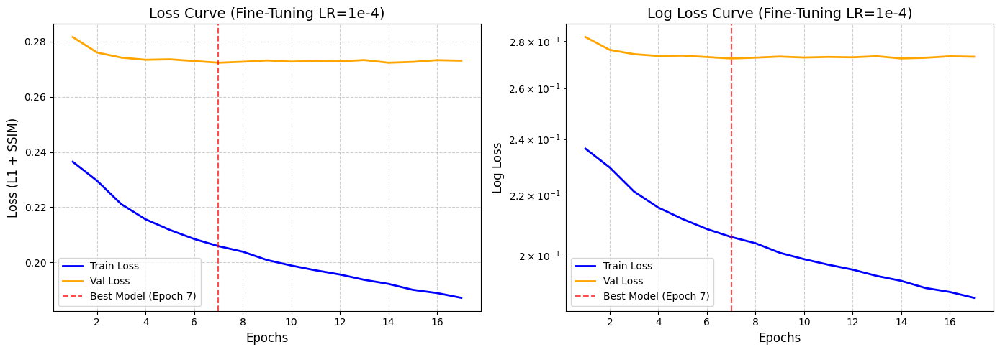

In [39]:
plot_loss_curves(history_lr_high, title_suffix="(Fine-Tuning LR=1e-4)")

### 7.2 Unfreezing More Encoder Layers

Let's also try unfreezing an additional layer (layer3) and give the encoder a bit more flexibility to adapt.

In [40]:
model = AutoencoderResNet18().to(device)

# Load the frozen pre-trained model weights
LOAD_PATH_FROZEN = CHECKPOINTS_DIR / "autoencoder_pretrained_frozen.pth"
model.load_state_dict(torch.load(LOAD_PATH_FROZEN, map_location=device))

# Unfreeze top layers of ResNet18 encoder (layer4)
model.unfreeze_top_encoder_layers()

# Unfreeze layer 3 as well (index 6 in our sequential encoder)
for param in model.encoder[6].parameters():
    param.requires_grad = True
print("ResNet18 'layer3' has also been unfrozen.")

# Hyperparameters
FINETUNE_LR = 1e-5 # Return to a cautious LR since we are updating more layers
FINETUNE_EPOCHS = 100
L1_WEIGHT = 0.5
SAVE_PATH_LAYERS = CHECKPOINTS_DIR / "autoencoder_pretrained_finetuned_layer34.pth"

ResNet18 'layer4' has been unfrozen for fine-tuning.
ResNet18 'layer3' has also been unfrozen.


In [41]:
print(f"Starting Fine-Tuning (Layers 3 & 4). Weights will be saved to {SAVE_PATH_LAYERS}\n")

history_layers = train_autoencoder(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=FINETUNE_EPOCHS,
    lr=FINETUNE_LR,
    l1_weight=L1_WEIGHT,
    save_path=SAVE_PATH_LAYERS,
    patience=10
)

Starting Fine-Tuning (Layers 3 & 4). Weights will be saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth

Starting training on mps for 100 epochs...


Epoch 1/100 - Train Loss: 0.2294 - Val Loss: 0.2861
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 2/100 - Train Loss: 0.2258 - Val Loss: 0.2855
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 3/100 - Train Loss: 0.2232 - Val Loss: 0.2848
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 4/100 - Train Loss: 0.2218 - Val Loss: 0.2843
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 5/100 - Train Loss: 0.2201 - Val Loss: 0.2841
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 6/100 - Train Loss: 0.2193 - Val Loss: 0.2840
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 7/100 - Train Loss: 0.2189 - Val Loss: 0.2837
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 8/100 - Train Loss: 0.2172 - Val Loss: 0.2836
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 9/100 - Train Loss: 0.2164 - Val Loss: 0.2832
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 10/100 - Train Loss: 0.2153 - Val Loss: 0.2830
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 11/100 - Train Loss: 0.2146 - Val Loss: 0.2835
 -> No improvement for 1/10 epoch(s).


Epoch 12/100 - Train Loss: 0.2135 - Val Loss: 0.2833
 -> No improvement for 2/10 epoch(s).


Epoch 13/100 - Train Loss: 0.2136 - Val Loss: 0.2831
 -> No improvement for 3/10 epoch(s).


Epoch 14/100 - Train Loss: 0.2130 - Val Loss: 0.2827
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 15/100 - Train Loss: 0.2117 - Val Loss: 0.2828
 -> No improvement for 1/10 epoch(s).


Epoch 16/100 - Train Loss: 0.2111 - Val Loss: 0.2829
 -> No improvement for 2/10 epoch(s).


Epoch 17/100 - Train Loss: 0.2109 - Val Loss: 0.2828
 -> No improvement for 3/10 epoch(s).


Epoch 18/100 - Train Loss: 0.2101 - Val Loss: 0.2830
 -> No improvement for 4/10 epoch(s).


Epoch 19/100 - Train Loss: 0.2099 - Val Loss: 0.2829
 -> No improvement for 5/10 epoch(s).


Epoch 20/100 - Train Loss: 0.2087 - Val Loss: 0.2828
 -> No improvement for 6/10 epoch(s).


Epoch 21/100 - Train Loss: 0.2083 - Val Loss: 0.2827
 -> No improvement for 7/10 epoch(s).


Epoch 22/100 - Train Loss: 0.2076 - Val Loss: 0.2828
 -> No improvement for 8/10 epoch(s).


Epoch 23/100 - Train Loss: 0.2073 - Val Loss: 0.2826
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 24/100 - Train Loss: 0.2067 - Val Loss: 0.2829
 -> No improvement for 1/10 epoch(s).


Epoch 25/100 - Train Loss: 0.2062 - Val Loss: 0.2825
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 26/100 - Train Loss: 0.2061 - Val Loss: 0.2827
 -> No improvement for 1/10 epoch(s).


Epoch 27/100 - Train Loss: 0.2051 - Val Loss: 0.2825
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_layer34.pth


Epoch 28/100 - Train Loss: 0.2043 - Val Loss: 0.2827
 -> No improvement for 1/10 epoch(s).


Epoch 29/100 - Train Loss: 0.2042 - Val Loss: 0.2827
 -> No improvement for 2/10 epoch(s).


Epoch 30/100 - Train Loss: 0.2041 - Val Loss: 0.2828
 -> No improvement for 3/10 epoch(s).


Epoch 31/100 - Train Loss: 0.2037 - Val Loss: 0.2830
 -> No improvement for 4/10 epoch(s).


Epoch 32/100 - Train Loss: 0.2033 - Val Loss: 0.2827
 -> No improvement for 5/10 epoch(s).


Epoch 33/100 - Train Loss: 0.2024 - Val Loss: 0.2828
 -> No improvement for 6/10 epoch(s).


Epoch 34/100 - Train Loss: 0.2018 - Val Loss: 0.2826
 -> No improvement for 7/10 epoch(s).


Epoch 35/100 - Train Loss: 0.2016 - Val Loss: 0.2828
 -> No improvement for 8/10 epoch(s).


Epoch 36/100 - Train Loss: 0.2014 - Val Loss: 0.2828
 -> No improvement for 9/10 epoch(s).


Epoch 37/100 - Train Loss: 0.2005 - Val Loss: 0.2831
 -> No improvement for 10/10 epoch(s).

Early stopping triggered! Training halted at epoch 37.
Training complete.


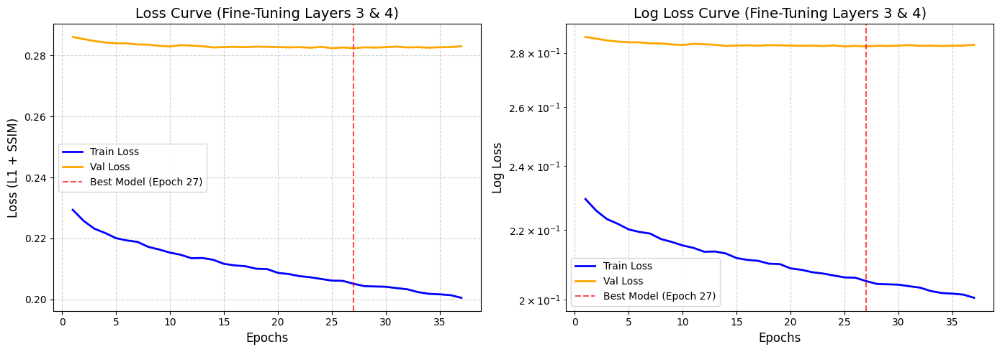

In [42]:
plot_loss_curves(history_layers, title_suffix="(Fine-Tuning Layers 3 & 4)")

### 7.3 Lower L1 Weight

L1 loss penalizes color differences, which may encourage the model to produce blurry/grey outputs to minimize overall error. SSIM, on the other hand, measures structural similarities, edges, and textures. Let's try giving SSIM more weight than L1 to see if we can force the model to care more about the internal wire structure.

In [48]:
model = AutoencoderResNet18().to(device)

# Load the frozen pre-trained model weights
LOAD_PATH_FROZEN = CHECKPOINTS_DIR / "autoencoder_pretrained_frozen.pth"
model.load_state_dict(torch.load(LOAD_PATH_FROZEN, map_location=device))

# Unfreeze top layers of ResNet18 encoder (layer4)
model.unfreeze_top_encoder_layers()

# Hyperparameters
FINETUNE_LR = 1e-5
FINETUNE_EPOCHS = 100
L1_WEIGHT_LOW = 0.1      # Prioritize SSIM (90% SSIM, 10% L1)
SAVE_PATH_SSIM = CHECKPOINTS_DIR / "autoencoder_pretrained_finetuned_ssim.pth"

ResNet18 'layer4' has been unfrozen for fine-tuning.


In [49]:
print(f"Starting Fine-Tuning (High SSIM Weight). Weights will be saved to {SAVE_PATH_SSIM}\n")

history_ssim = train_autoencoder(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=FINETUNE_EPOCHS,
    lr=FINETUNE_LR,
    l1_weight=L1_WEIGHT_LOW,
    save_path=SAVE_PATH_SSIM,
    patience=10
)

Starting Fine-Tuning (High SSIM Weight). Weights will be saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth

Starting training on mps for 100 epochs...


Epoch 1/100 - Train Loss: 0.3577 - Val Loss: 0.4475
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 2/100 - Train Loss: 0.3522 - Val Loss: 0.4453
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 3/100 - Train Loss: 0.3491 - Val Loss: 0.4450
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 4/100 - Train Loss: 0.3465 - Val Loss: 0.4446
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 5/100 - Train Loss: 0.3450 - Val Loss: 0.4441
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 6/100 - Train Loss: 0.3434 - Val Loss: 0.4440
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 7/100 - Train Loss: 0.3422 - Val Loss: 0.4436
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 8/100 - Train Loss: 0.3407 - Val Loss: 0.4439
 -> No improvement for 1/10 epoch(s).


Epoch 9/100 - Train Loss: 0.3391 - Val Loss: 0.4431
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 10/100 - Train Loss: 0.3374 - Val Loss: 0.4434
 -> No improvement for 1/10 epoch(s).


Epoch 11/100 - Train Loss: 0.3364 - Val Loss: 0.4432
 -> No improvement for 2/10 epoch(s).


Epoch 12/100 - Train Loss: 0.3351 - Val Loss: 0.4429
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 13/100 - Train Loss: 0.3343 - Val Loss: 0.4432
 -> No improvement for 1/10 epoch(s).


Epoch 14/100 - Train Loss: 0.3330 - Val Loss: 0.4432
 -> No improvement for 2/10 epoch(s).


Epoch 15/100 - Train Loss: 0.3326 - Val Loss: 0.4429
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 16/100 - Train Loss: 0.3311 - Val Loss: 0.4427
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 17/100 - Train Loss: 0.3308 - Val Loss: 0.4429
 -> No improvement for 1/10 epoch(s).


Epoch 18/100 - Train Loss: 0.3295 - Val Loss: 0.4428
 -> No improvement for 2/10 epoch(s).


Epoch 19/100 - Train Loss: 0.3285 - Val Loss: 0.4427
 -> Validation loss improved! Model saved to /Users/tohjiale/Desktop/50039-proj-group07-2026/checkpoints/autoencoder_pretrained_finetuned_ssim.pth


Epoch 20/100 - Train Loss: 0.3280 - Val Loss: 0.4427
 -> No improvement for 1/10 epoch(s).


Epoch 21/100 - Train Loss: 0.3275 - Val Loss: 0.4428
 -> No improvement for 2/10 epoch(s).


Epoch 22/100 - Train Loss: 0.3259 - Val Loss: 0.4428
 -> No improvement for 3/10 epoch(s).


Epoch 23/100 - Train Loss: 0.3250 - Val Loss: 0.4427
 -> No improvement for 4/10 epoch(s).


Epoch 24/100 - Train Loss: 0.3244 - Val Loss: 0.4429
 -> No improvement for 5/10 epoch(s).


Epoch 25/100 - Train Loss: 0.3238 - Val Loss: 0.4432
 -> No improvement for 6/10 epoch(s).


Epoch 26/100 - Train Loss: 0.3229 - Val Loss: 0.4429
 -> No improvement for 7/10 epoch(s).


Epoch 27/100 - Train Loss: 0.3221 - Val Loss: 0.4429
 -> No improvement for 8/10 epoch(s).


Epoch 28/100 - Train Loss: 0.3220 - Val Loss: 0.4429
 -> No improvement for 9/10 epoch(s).


Epoch 29/100 - Train Loss: 0.3205 - Val Loss: 0.4431
 -> No improvement for 10/10 epoch(s).

Early stopping triggered! Training halted at epoch 29.
Training complete.


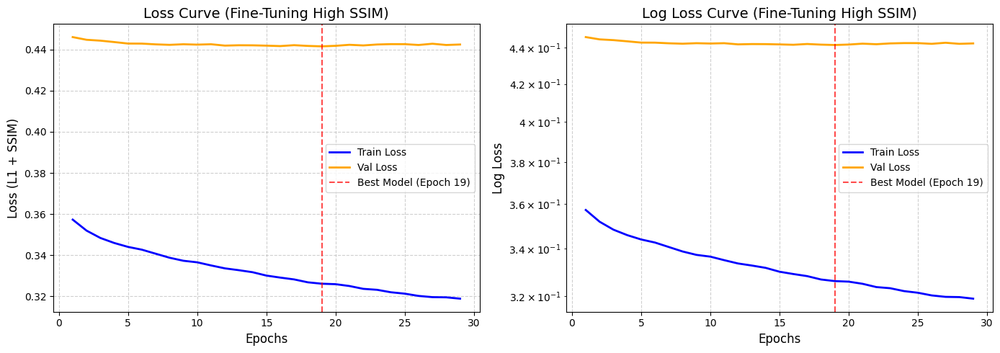

In [46]:
plot_loss_curves(history_ssim, title_suffix="(Fine-Tuning High SSIM)")

### 7.4 Evaluating the Variations

Let's do a quick visual check of the validation reconstructions for all three variations to see if any of them can successfully capture the missing internal wire structures.

#### 7.4.1 Reconstruction Quality

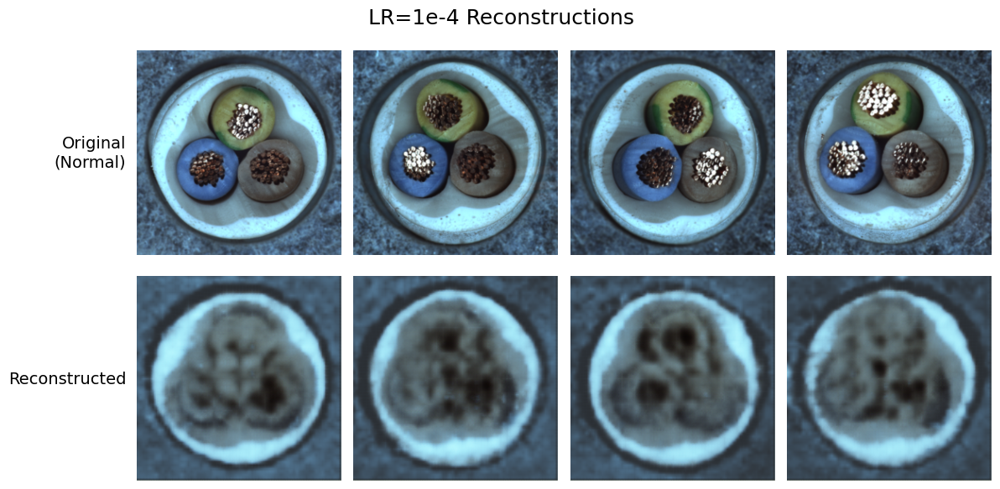

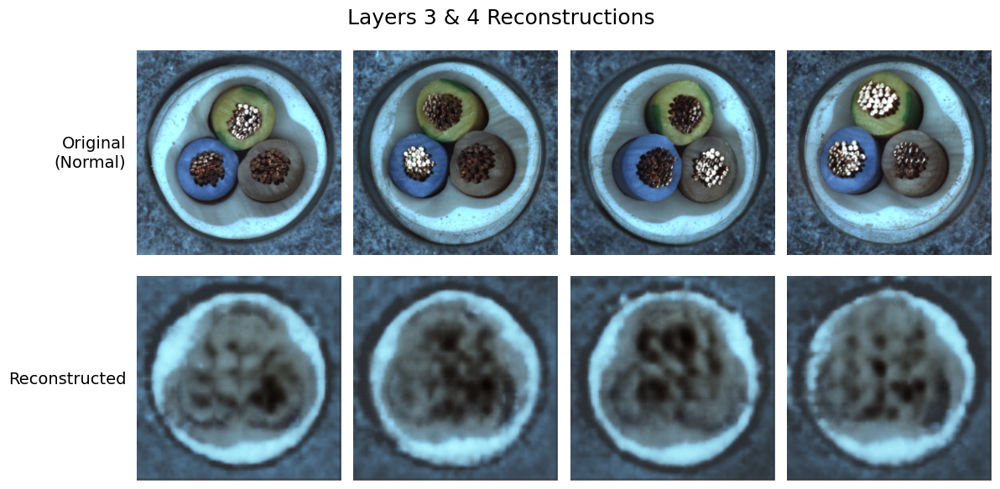

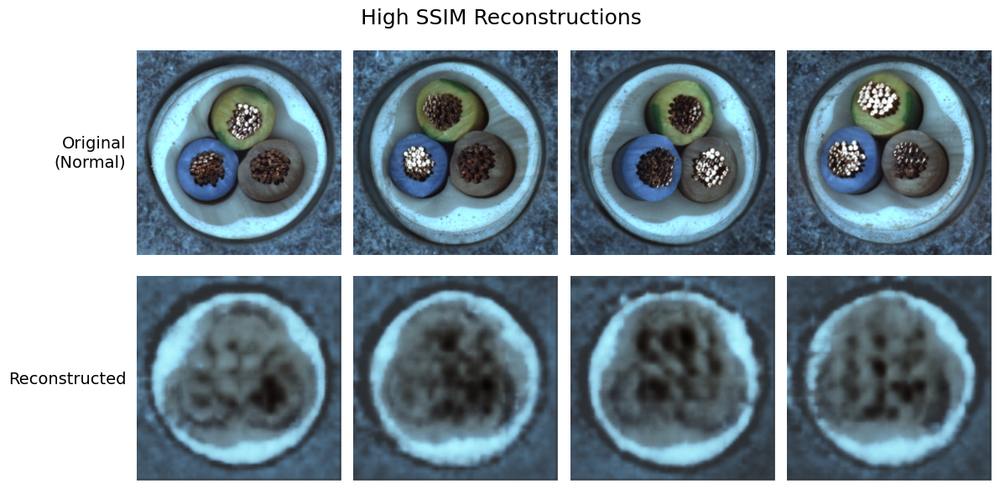

In [51]:
# Get a single validation batch
val_batch = next(iter(val_loader))
val_images = val_batch.to(device)

# Experiment paths and titles
paths_and_titles = [
    (SAVE_PATH_LR_HIGH, "LR=1e-4 Reconstructions"),
    (SAVE_PATH_LAYERS, "Layers 3 & 4 Reconstructions"),
    (SAVE_PATH_SSIM, "High SSIM Reconstructions")
]

with torch.no_grad():
    for fig_no, (path, title) in enumerate(paths_and_titles):
        # Load weights of experiment
        model.load_state_dict(torch.load(path, map_location=device))
        model.eval()

        # Generate reconstructions
        reconstructed = model(val_images)

        # Plot normal reconstructions
        plot_normal_reconstructions(
            original_tensors=val_images,
            recon_tensors=reconstructed,
            title=title,
            num_samples=4,
            # save=True,
            # save_path=FIGURES_DIR / f"Fig{28 + fig_no}_{title.replace(' ', '_')}.png"
        )

#### 7.4.1 Metrics Calculation

The visual reconstructions showed little to no improvement from the original frozen pre-trained encoder. Let's just calculate the anomaly detection metrics directly to verify.

In [52]:
print("Evaluating fine-tuning variations on the test set...\n")

for path, title in paths_and_titles:
    print(f"========================================")
    print(f"  {title}")
    print(f"========================================")
    
    # Load weights
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    
    # Generate anomaly maps
    anomaly_maps_var, masks_var, labels_var = generate_anomaly_maps(model, test_loader, device)
    
    # Calculate metrics
    img_auroc_var = calculate_image_auroc(anomaly_maps_var, labels_var)
    pix_auroc_var = calculate_pixel_auroc(anomaly_maps_var, masks_var)
    aupro_var = calculate_aupro(anomaly_maps_var, masks_var)
    
    print(f"Image AUROC : {img_auroc_var:.4f}")
    print(f"Pixel AUROC : {pix_auroc_var:.4f}")
    print(f"AUPRO       : {aupro_var:.4f}\n")

Evaluating fine-tuning variations on the test set...

  LR=1e-4 Reconstructions


Image AUROC : 0.4237
Pixel AUROC : 0.8254
AUPRO       : 0.4796

  Layers 3 & 4 Reconstructions


Image AUROC : 0.4352
Pixel AUROC : 0.8137
AUPRO       : 0.4718

  High SSIM Reconstructions


Image AUROC : 0.4202
Pixel AUROC : 0.8113
AUPRO       : 0.4110



## 8. Discussion

| Metric\Model | Baseline 3-Block | 4-Block | 5-Block | Pre-Trained (Frozen) | Fine-Tuned (L4) | Fine-Tuned (LR 1e-4) | Fine-Tuned (L3/L4) | Fine-Tuned (High SSIM) |
| :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- | :--- |
| **Image AUROC** | 0.4412 | 0.4625 | 0.5547 | 0.4670 | 0.4299 | 0.4237 | 0.4352 | 0.4202 |
| **Pixel AUROC** | 0.5878 | 0.6147 | 0.6937 | 0.8114 | 0.8112 | 0.8254 | 0.8137 | 0.8113 |
| **AUPRO** | 0.1270 | 0.2455 | 0.3625 | 0.4313 | 0.3877 | 0.4796 | 0.4718 | 0.4110 |

### 8.1 Performance of the Pre-Trained Backbone

Swapping our custom 5-block encoder for a pre-trained ResNet18 improved Pixel AUROC (increasing from 0.6937 to 0.8114) and AUPRO (0.3625 to 0.4313). The pre-trained model tends to produce stronger pixel-wise reconstruction errors overall, especially in some defect regions such as `missing_cable` (See Fig 25 in 4.3.2). In those cases, the missing region (black in the original image) differs noticeably from the model’s usual grey-brown reconstruction, so the defect area stands out more clearly in the anomaly map. This improves pixel-level separation and region-level overlap, even if the reconstructions are poor overall.

However, the seemingly high Pixel AUROC is likely also inflated by the large number of background pixels, which are relatively easy to classify correctly. At the same time, the model produces elevated errors in many non-defective cable regions, which hurts Image AUROC because normal images can still receive high image-level anomaly scores. In other words, the frozen pre-trained encoder became better at highlighting some defect pixels, but not better at cleanly separating whole normal vs anomalous images.

### 8.2 Limited Benefit of Fine-Tuning

None of the fine-tuning variations improved Image AUROC over the frozen pre-trained encoder, and the gains in Pixel AUROC and AUPRO were either very small or inconsistent. This suggests that the main problem was not simply that the encoder features were too generic, but that the overall architecture still struggled to reconstruct the internal cable structure faithfully. In particular, unfreezing layer4, increasing the fine-tuning learning rate, unfreezing both layer3 and layer4, or reducing the L1 weight did not resolve the persistent reconstruction errors in non-defective cable regions. These results suggest that minor fine-tuning changes are not enough, and that a more substantial architectural change may be needed.

## 9. Conclusion

While the frozen pre-trained encoder achieved the best Pixel AUROC and AUPRO so far, overall reconstruction remains poor, and fine-tuning variations did not meaningfully improve Image AUROC or the quality of the internal cable reconstruction. This indicates that transfer learning is helpful, but minor fine-tuning changes alone are not enough for this dataset.

In this notebook, we:
- Replaced the custom encoder with a pre-trained ResNet18 backbone and trained an autoencoder with the encoder kept frozen.
- Tested several fine-tuning variations, including unfreezing layer4, increasing the fine-tuning learning rate, unfreezing both layer3 and layer4, and increasing the SSIM weight.
- Evaluated all pre-trained variations against the earlier convolutional autoencoders using Image AUROC, Pixel AUROC, and AUPRO, and found that while they improved pixel-level metrics, Image AUROC remains poor and fine-tuning variations produced little gains.


### 9.1 Recommendations for Future Work

Given the fundamental spatial limitations of bottleneck autoencoders discovered in these experiments, future work on complex industrial datasets like MVTec AD cables should pivot away from pure reconstruction models. Based on our findings, we recommend:

* **Exploring Skip-Connection Architectures with Masking:** Implementing models such as U-Net, which utilize skip connections to bypass the spatial bottleneck entirely, allowing high-resolution structural details to be passed directly to the decoder. Because skip connections risk allowing defects to pass straight through to the output (identity mapping), these models must be paired with masked inpainting strategies. By artificially masking regions of the input during training, the network is forced to hallucinate healthy cable structures into the missing gaps rather than blindly copying defects.
* **Adopting Feature-Matching Models:** Shifting to state-of-the-art industrial anomaly detection methods like PaDiM or PatchCore. These architectures leverage pre-trained features to detect anomalies via statistical distance metrics in the embedding space. By completely eliminating the need to reconstruct the image pixel-by-pixel, they entirely avoid the spatial compression trade-off we observed.
* **Applying Denoising Strategies:** For any future autoencoder attempts, utilizing artificial corruption (such as Denoising Autoencoders with Gaussian noise or synthetic cutouts). This forces the network to actively repair the input rather than relying on a safe, blurry average, encouraging it to learn a more robust, mathematically stable representation of the complex internal wires.

## References
- **ResNet18:** Karmakar, T. (2024). Introduction to ResNet-18. Kaggle. https://www.kaggle.com/code/iamtapendu/introduction-to-resnet-18